In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
import torchaudio
import soundfile as sf
import seaborn as sns

from pathlib import Path
import plotly.express as px
import matplotlib.pyplot as plt
from IPython.display import Audio

In [3]:
class CFG:
    random_seed = 42

In [4]:
train_dir = Path('E:\data\BirdCLEF')
train_audio = train_dir / 'train_audio'
train_csv = train_dir / 'train_metadata.csv'
bird20223 = train_dir / 'bird2023.csv'
taxonomy_csv = train_dir / 'eBird_Taxonomy_v2021.csv'

### Metadata

In [5]:
taxonomy_df = pd.read_csv(taxonomy_csv)
meta_df = pd.read_csv(train_csv)
df_23 = pd.read_csv(bird20223)
sample_submission = pd.read_csv(train_dir / 'sample_submission.csv')
ss_2023 = pd.read_csv(train_dir / 'sample_submission_2023.csv')

meta_df.shape, df_23.shape, taxonomy_df.shape

((24459, 14), (16941, 12), (16753, 9))

In [6]:
labels = sample_submission.columns[1:].to_list()
labels2023 = ss_2023.columns[1:].to_list()

len(labels), len(labels2023)

(182, 264)

In [7]:
unique2024 = list(set(labels) - set(labels2023))
unique2023 = list(set(labels2023) - set(labels))

len(labels2023), len(labels)

(264, 182)

In [8]:
df_23.sample(2)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
3240,categr,[],['call'],8.2990,-70.0851,Bubulcus ibis,Cattle Egret,Joe Klaiber,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/197438,categr/XC197438.ogg
16355,yebapa1,[],['song'],-3.0675,36.7057,Apalis flavida,Yellow-breasted Apalis,isaac kilusu,Creative Commons Attribution-NonCommercial-Sha...,0.0,https://www.xeno-canto.org/525935,yebapa1/XC525935.ogg


In [9]:
meta_df[meta_df['filename'] == 'spemou2/XC368137.ogg']

# df_23[df_23['filename'] == 'asbfly/XC134896.ogg']

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,file,duration


In [10]:
meta_df.head(2)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,file,duration
0,asbfly,[],['call'],39.2297,118.1987,Muscicapa dauurica,Asian Brown Flycatcher,Matt Slaymaker,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/134896,asbfly/XC134896.ogg,XC134896.ogg,27
1,asbfly,[],['song'],51.4030,104.6401,Muscicapa dauurica,Asian Brown Flycatcher,Magnus Hellström,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/164848,asbfly/XC164848.ogg,XC164848.ogg,15


In [22]:
meta_df.file.value_counts()

file
XC503389.ogg    2
XC306398.ogg    2
XC514027.ogg    2
XC447036.ogg    2
XC522123.ogg    2
               ..
XC362180.ogg    1
XC362179.ogg    1
XC359359.ogg    1
XC358708.ogg    1
XC858550.ogg    1
Name: count, Length: 24440, dtype: int64

In [19]:
meta_df[meta_df.file == 'XC503389.ogg']

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,file,duration
5403,comior1,[],[''],1.314,103.8152,Aegithina tiphia,Common Iora,Björn Söderlund,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://xeno-canto.org/503389,comior1/XC503389.ogg,XC503389.ogg,20
23299,whtkin2,[],['song'],1.314,103.8152,Halcyon smyrnensis,White-throated Kingfisher,Björn Söderlund,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/503389,whtkin2/XC503389.ogg,XC503389.ogg,20


In [14]:
meta_df.file.duplicated().sum()

19

In [16]:
meta_df[meta_df.file.duplicated()]

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename,file,duration
10389,goflea1,[],[''],15.5442,73.7733,Chloropsis aurifrons,Golden-fronted Leafbird,Albert Lastukhin,Creative Commons Attribution-NonCommercial-Sha...,2.0,https://xeno-canto.org/163901,goflea1/XC163901.ogg,XC163901.ogg,14
10397,goflea1,[],[''],15.5442,73.7733,Chloropsis aurifrons,Golden-fronted Leafbird,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://xeno-canto.org/208794,goflea1/XC208794.ogg,XC208794.ogg,100
10398,goflea1,[],[''],15.5442,73.7733,Chloropsis aurifrons,Golden-fronted Leafbird,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://xeno-canto.org/208795,goflea1/XC208795.ogg,XC208795.ogg,106
10399,goflea1,[],[''],15.5442,73.7733,Chloropsis aurifrons,Golden-fronted Leafbird,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://xeno-canto.org/209203,goflea1/XC209203.ogg,XC209203.ogg,72
10400,goflea1,[],[''],15.5442,73.7733,Chloropsis aurifrons,Golden-fronted Leafbird,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://xeno-canto.org/209549,goflea1/XC209549.ogg,XC209549.ogg,133
10401,goflea1,[],[''],15.5442,73.7733,Chloropsis aurifrons,Golden-fronted Leafbird,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://xeno-canto.org/209564,goflea1/XC209564.ogg,XC209564.ogg,10
16056,labcro1,[],['call'],24.0974,38.0507,Corvus macrorhynchos,Large-billed Crow,David Darrell-Lambert,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/447036,labcro1/XC447036.ogg,XC447036.ogg,12
16259,laudov1,[],"['adult', 'sex uncertain', 'song']",16.8660,75.7371,Streptopelia senegalensis,Laughing Dove,Ramesh Desai,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/514027,laudov1/XC514027.ogg,XC514027.ogg,50
17062,litegr,[],[''],43.5352,-1.4475,Egretta garzetta,Little Egret,Frédéric Cazaban,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://xeno-canto.org/403621,litegr/XC403621.ogg,XC403621.ogg,14
17941,litspi1,[],[''],18.0362,102.3730,Arachnothera longirostra,Little Spiderhunter,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://xeno-canto.org/674522,litspi1/XC674522.ogg,XC674522.ogg,44


In [104]:
meta_df[meta_df['scientific_name'].str.contains('Alauda gulgula')]

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename


In [105]:
taxonomy_df[taxonomy_df['SCI_NAME'].str.contains('Alauda gulgula')]

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
10942,21922,species,orisky1,Oriental Skylark,Alauda gulgula,Passeriformes,Alaudidae (Larks),NaN,NaN


In [42]:
taxonomy_df.head(2)

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN


In [43]:
taxonomy_df['SPECIES_CODE'].count()

16753

In [44]:
taxonomy_df[taxonomy_df['SPECIES_CODE'] == 'integr']

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
4037,7207,species,integr,Intermediate Egret,Ardea intermedia,Pelecaniformes,"Ardeidae (Herons, Egrets, and Bitterns)",NaN,NaN


In [45]:
meta_df.primary_label.value_counts()

primary_label
zitcis1    500
lirplo     500
litgre1    500
comgre     500
comkin1    500
          ... 
blaeag1      6
wynlau1      6
niwpig1      5
asiope1      5
integr       5
Name: count, Length: 182, dtype: int64

In [46]:
meta_df.filename[0]

'asbfly/XC134896.ogg'

In [47]:
# import plotly.io as pio
# pio.renderers

In [48]:
data, rate = torchaudio.load(train_audio / meta_df.filename[0])
print("Audio data shape:", data.shape)
print("Sample rate:", rate)

Audio data shape: torch.Size([1, 875207])
Sample rate: 32000


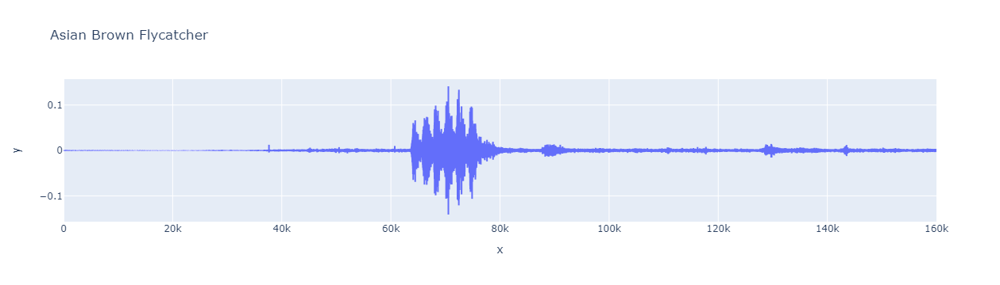

In [49]:
display(Audio(data[0, :rate*5], rate=rate))
px.line(y=data[0, :rate*5], title=meta_df.common_name[0])
# fig.show()

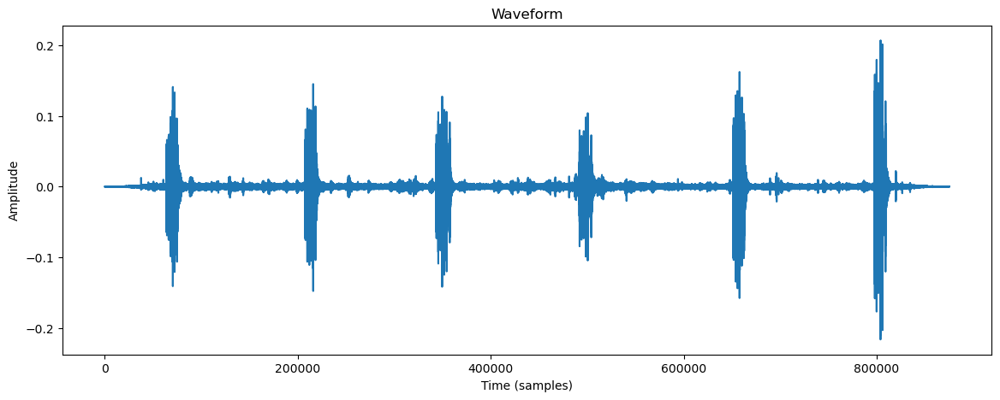

In [50]:
plt.figure(figsize=(14, 5))
plt.plot(data[0, 0:])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.title('Waveform')
plt.show()

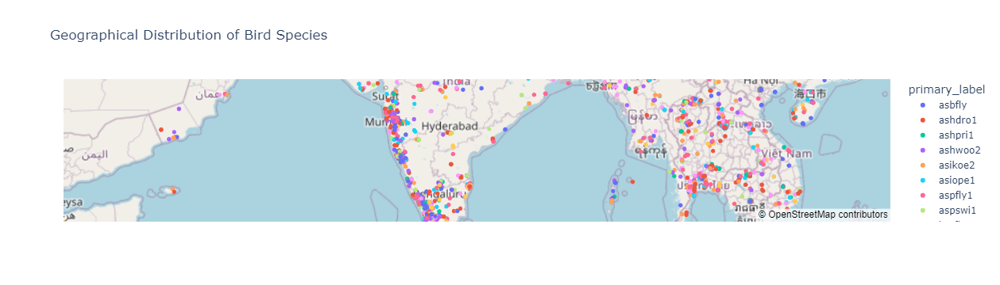

In [51]:
# Assuming metadata_df contains the data
# Create scatter plot on a map
fig = px.scatter_mapbox(meta_df, lat='latitude', lon='longitude', color='primary_label', 
                        hover_name='primary_label', hover_data=['latitude', 'longitude'], 
                        title='Geographical Distribution of Bird Species',
                        zoom=1, height=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

### Missing labels

In [52]:
primary = meta_df.primary_label.unique().tolist()
type(primary), len(primary)

(list, 182)

In [53]:
secondary = meta_df[meta_df['secondary_labels'] != '[]']
secondary.shape

(1892, 12)

In [54]:
secondary = secondary.secondary_labels.tolist()
secondary = [eval(x) for x in secondary]
len(secondary)

1892

In [55]:
sec_lab = [x for xs in secondary for x in xs]
print(len(sec_lab))
sec_lab = set(sec_lab)
len(sec_lab)

2637


140

In [56]:
unique_primary = list(set(primary) - set(sec_lab))
unique_secondary = list(set(sec_lab) - set(primary))
len(unique_primary), len(unique_secondary)

(48, 6)

In [57]:
unique_secondary

['orhthr1', 'asfblu1', 'magrob', 'lotshr1', 'indwhe1', 'bltmun1']

### Distribution

In [58]:
def cat_feature_dist(data, feature):
    # Count unique values
    value_counts = data[feature].value_counts().sort_values(ascending=False)
    
    # Plot
    fig = px.bar(y=value_counts.index[::-1], x=value_counts[::-1], orientation='h')
    fig.update_yaxes(title='')
    fig.update_xaxes(title_text='Count')
    fig.update_layout(
        showlegend=False, 
        plot_bgcolor='#1C1D20', 
        paper_bgcolor='#1C1D20',
        font=dict(size=16, color='#E1B12D'),
        title_font=dict(size=20, color='#222'),
        barmode='group',  
        title=f"Distribution of '{feature}'"
    )
    fig.show()
    print(f"\nTotal unique values in '{feature}'are:",data[feature].nunique())
    print("\nTop 5 values:", value_counts.head())
    print("\nBottom 5 values:", value_counts.tail())

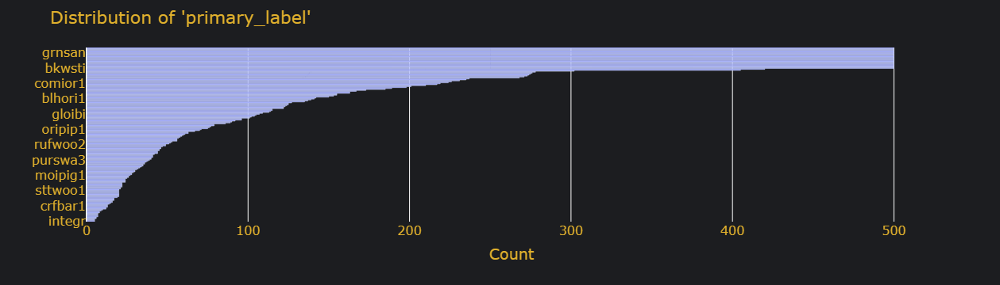


Total unique values in 'primary_label'are: 182

Top 5 values: primary_label
zitcis1    500
lirplo     500
barswa     500
woosan     500
bcnher     500
Name: count, dtype: int64

Bottom 5 values: primary_label
blaeag1    6
wynlau1    6
niwpig1    5
asiope1    5
integr     5
Name: count, dtype: int64


In [59]:
cat_feature_dist(meta_df, 'primary_label')

In [70]:
# cat_feature_dist(up_df, 'primary_label')


# BirdCLEF - 23
> Before Upsample: 24459
> After Upsample: 26478


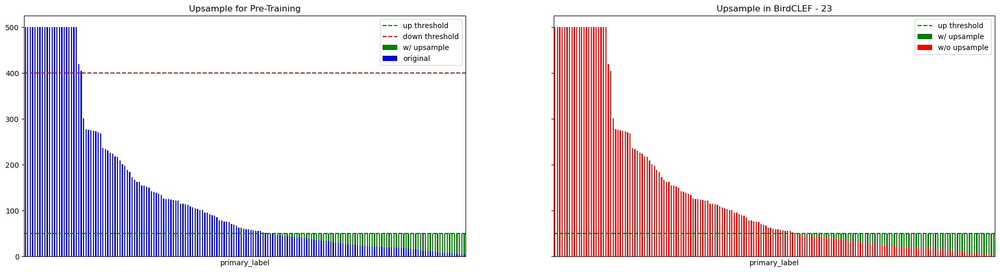

In [77]:
plt.figure(figsize=(12*2, 6))

label = 'primary_label'

# Upsample data
up_thr = 50
up_df = upsample_data(meta_df, thr=up_thr)
print("\n# BirdCLEF - 23")
print(f'> Before Upsample: {len(meta_df)}')
print(f'> After Upsample: {len(up_df)}')

ax1 = plt.subplot(1, 2, 1)
up_df[label].value_counts()[:].plot.bar(color='green', label='w/ upsample')
meta_df[label].value_counts()[:].plot.bar(color='blue', label='original')

# dn_df[label].value_counts()[:].plot.bar(color='red', label='w/ dowsample')
plt.xticks([])
plt.axhline(y=up_thr, color='g', linestyle='--', label='up threshold')
plt.axhline(y=400, color='r', linestyle='--', label='down threshold')
plt.legend()
plt.title("Upsample for Pre-Training")

# Show effect of upsample
ax2 = plt.subplot(1, 2, 2, sharey=ax1)
up_df[label].value_counts()[:].plot.bar(color='green', label='w/ upsample')
meta_df[label].value_counts()[:].plot.bar(color='red', label='w/o upsample')
plt.xticks([])
plt.axhline(y=up_thr, color='g', linestyle='--', label='up threshold')
plt.legend()
plt.title("Upsample in BirdCLEF - 23")

# plt.tight_layout()
plt.show()

In [73]:
# up_df.head()

### Secondary labels

In [81]:
meta_df[meta_df['secondary_labels'] != '[]'].shape, meta_df.shape

((1892, 12), (24459, 12))

In [80]:
primary_df = meta_df[meta_df['secondary_labels'] == '[]']
primary_df.shape

(22567, 12)

In [88]:
# aparently not loosing any labels when filtering out secondary labels
len(meta_df.primary_label.unique()), len(primary_df.primary_label.unique())

(182, 182)

In [79]:
meta_df[meta_df['secondary_labels'] == '[]'].primary_label.value_counts()

primary_label
comsan     488
graher1    486
commoo3    485
eurcoo     484
bcnher     484
          ... 
wynlau1      6
malwoo1      6
integr       5
asiope1      5
niwpig1      4
Name: count, Length: 182, dtype: int64

### BirdNet